In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# For data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Ingore the warnings
import warnings
warnings.filterwarnings('ignore')

# DL Libraries
import os
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory, to_categorical
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
import json  # Import thư viện json
from keras.models import load_model

from keras.optimizers import Adam
print("GPU available:", tf.config.list_physical_devices('GPU'))

GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications import DenseNet121
# from tensorflow.keras.applications import NASNetLarge


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

## 1. Đọc và xử lý tiền dữ liệu

In [4]:
#set up contanst
COLOR_MODE = 'rgb'
IMG_WIDTH = 224
IMG_HEIGHT = 224
IMG_CHANNELS = 3
BATCH_SIZE = 32
BUFFER_SIZE = BATCH_SIZE*5

# Load the image dataset from the directory using utils
dataset = keras.utils.image_dataset_from_directory(
    directory = '/content/gdrive/MyDrive/Train_Augmented_500/train',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(224, 224),
    color_mode='rgb',
    shuffle=True,
    seed=123
)

test_ds = keras.utils.image_dataset_from_directory(
    directory='/content/gdrive/MyDrive/Train_Augmented_500/test',
    labels='inferred',
    label_mode='int',
    batch_size=BATCH_SIZE,
    image_size=(IMG_WIDTH, IMG_HEIGHT),
    color_mode=COLOR_MODE,
    shuffle=False
)

Found 8775 files belonging to 15 classes.
Found 975 files belonging to 15 classes.


### 1.2 Chia lại tập dữ liệu với tỷ lệ 80% train, 20% validation

In [5]:
# Calculate the size of train and validation sets
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size
test_size = len (test_ds)

# Split the dataset into train and validation
train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)

In [6]:
# Sử dụng caching và prefetching để tối ưu hóa hiệu suất
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Kiểm tra kích thước của các tập dữ liệu
print(f'Train dataset size: {train_size * 32} images')
print(f'Validation dataset size: {val_size * 32} images')
print(f'Test dataset size: {test_size * 32} images')


Train dataset size: 7040 images
Validation dataset size: 1760 images
Test dataset size: 992 images


In [7]:
# Extrating the class labels
# Trích xuất nhãn lớp
classes = dataset.class_names
print(f'{classes}')

# Đảm bảo nhãn được mã hóa one-hot
def preprocess_dataset(dataset, num_classes):
    def one_hot_encode(image, label):
        label = tf.one_hot(label, num_classes)
        return image, label
    return dataset.map(one_hot_encode)

# 'classes' là danh sách chứa các lớp
num_classes = len(classes)

train_ds = preprocess_dataset(train_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = preprocess_dataset(val_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = preprocess_dataset(test_ds, num_classes).cache().prefetch(buffer_size=tf.data.AUTOTUNE)

['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Zebra']


In [ ]:
normalization_layer_64 = tf.keras.layers.Rescaling(1./64)
train_ds_64 = train_ds.map(lambda x, y: (normalization_layer_64(x), y))
val_ds_64 = val_ds.map(lambda x, y: (normalization_layer_64(x), y))
test_ds_64 = test_ds.map(lambda x, y: (normalization_layer_64(x), y))

### 1.3.Hiển thị dữ liệu đầu vào

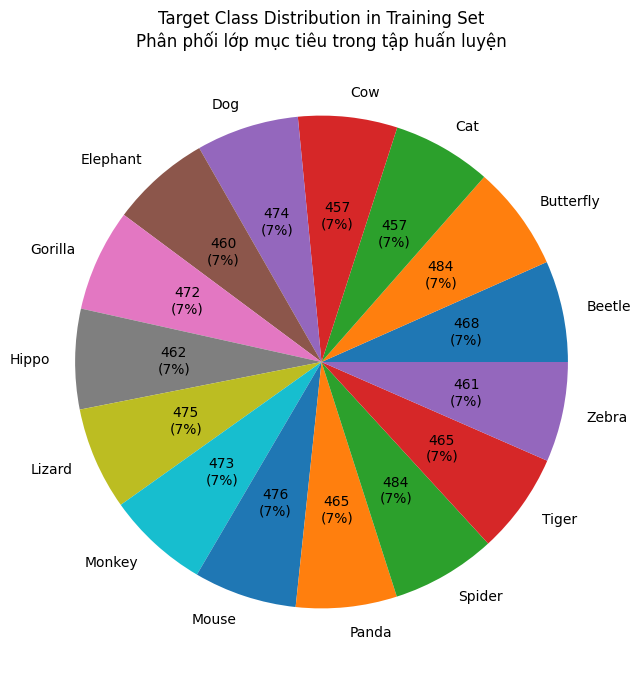

In [ ]:
# Get number of classes
num_classes = len(classes)

# Count the number of images for each class in the training set
label_counts = np.zeros(num_classes, dtype=int)

for images, labels in train_ds:
    for label in labels.numpy():
        label_counts[np.argmax(label)] += 1  # Using np.argmax to get the class index

# Create the pie chart
def autopct_generator(counts):
    def inner_autopct(pct):
        total = sum(counts)
        absolute = int(pct / 100. * total)
        return f"{absolute}\n({pct:.0f}%)"
    return inner_autopct

plt.figure(figsize=(10, 8))
plt.pie(label_counts, labels=classes, autopct=autopct_generator(label_counts))
plt.title('Target Class Distribution in Training Set\nPhân phối lớp mục tiêu trong tập huấn luyện')

plt.show()

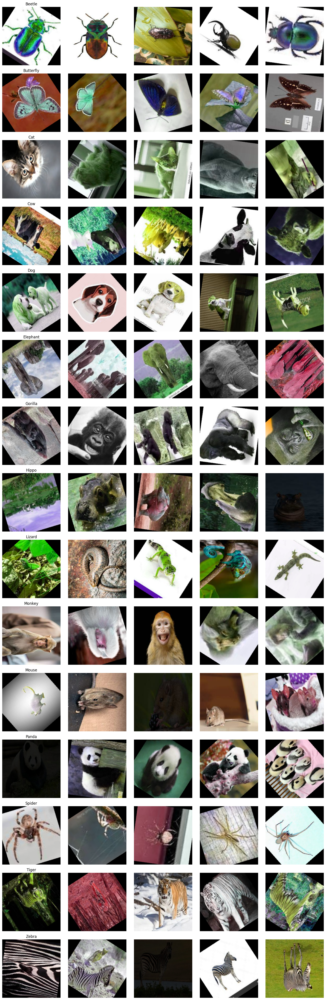

In [ ]:
# Số lượng lớp học
num_classes = len(dataset.class_names)

# Khởi tạo danh sách để lưu trữ hình ảnh cho mỗi lớp
images_per_class = {class_name: [] for class_name in dataset.class_names}

# Duyệt qua tập dữ liệu kiểm tra và lưu 5 hình ảnh cho mỗi lớp
for images, labels in test_ds:
    for img, lbl in zip(images.numpy(), labels.numpy()):
        class_idx = np.argmax(lbl)
        class_name = dataset.class_names[class_idx]
        if len(images_per_class[class_name]) < 5:
            images_per_class[class_name].append(img)
        # Nếu đã thu thập đủ 5 hình ảnh cho tất cả các lớp, thoát khỏi vòng lặp
        if all(len(images_per_class[class_name]) >= 5 for class_name in dataset.class_names):
            break
    # Kiểm tra lại điều kiện thoát
    if all(len(images_per_class[class_name]) >= 5 for class_name in dataset.class_names):
        break

# Vẽ hình ảnh
fig, axes = plt.subplots(num_classes, 5, figsize=(15, num_classes * 3))
for class_idx, (class_name, images) in enumerate(images_per_class.items()):
    for img_idx, img in enumerate(images):
        ax = axes[class_idx, img_idx]
        ax.imshow(img.astype("uint8"))
        ax.axis('off')
        if img_idx == 0:
            ax.set_title(class_name)

plt.tight_layout()
plt.show()

# **2. Create model based on Fine-tuning**

---

### 2.1. VGG16

In [ ]:
vgg16 = VGG16(include_top=False,
                   weights='imagenet',
                   input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

for layer in vgg16.layers:
  layer.trainable = False

flat = Flatten()(vgg16.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
output = Dense(len(classes), activation='softmax')(fc1)

model1 = Model(inputs=vgg16.inputs, outputs=output)
model1.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
# Biên dịch mô hình
model1.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Huấn luyện mô hình
history1 = model1.fit(train_ds, batch_size=32, epochs=10,
          validation_data=(val_ds))

Epoch 1/10
214/214 [==============================] - 5232s 24s/step - loss: 9.2447 - accuracy: 0.5577 - val_loss: 1.2567 - val_accuracy: 0.6875
Epoch 2/10
204/214 [===========================>..] - ETA: 3:03 - loss: 0.5784 - accuracy: 0.8514

### 2.2. EfficientNetB7

In [8]:
efficientnetb7 = EfficientNetB7(include_top=False,
                                weights ='imagenet',
                                input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS))

for layer in efficientnetb7.layers:
  layer.trainable = False


flat = Flatten()(efficientnetb7.layers[-1].output)
# flat = Flatten()(efficientnetb7.output)
fc1 = Dense(1024, activation='relu')(flat)
output = Dense(len(classes), activation='softmax')(fc1)

model2 = Model(inputs=efficientnetb7.inputs, outputs=output)
model2.summary()


258076736/258076736 [==============================] - 7s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)   

In [ ]:
# Biên dịch mô hình
model2.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Huấn luyện mô hình
history2 = model2.fit(train_ds, batch_size=32, epochs=10,
          validation_data=val_ds)

Epoch 1/10
105/220 [=============>................] - ETA: 16:55 - loss: 4.9849 - accuracy: 0.7057

### 2.3. MobileNetV3

In [ ]:
mobilenetv3small = MobileNetV3Small(input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS),
                                    include_top=False,
                                    weights='imagenet',
                                    classes=15)

for layer in mobilenetv3small.layers:
  layer.trainable = False

flat = Flatten()(mobilenetv3small.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
output = Dense(len(classes), activation='sigmoid')(fc1)

model3 = Model(inputs=mobilenetv3small.inputs, outputs=output)
model3.summary()

4334752/4334752 [==============================] - 1s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_2[0][0]']             
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling[0][0]']           
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)                   

In [ ]:
# Biên dịch mô hình
model3.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Huấn luyện mô hình
history3 = model3.fit(train_ds, batch_size=32, epochs=10,
          validation_data=val_ds)

Epoch 1/10
164/164 [==============================] - 11s 40ms/step - loss: 3.4396 - accuracy: 0.6498 - val_loss: 0.6245 - val_accuracy: 0.8072
Epoch 2/10
164/164 [==============================] - 5s 32ms/step - loss: 0.1176 - accuracy: 0.9606 - val_loss: 0.7183 - val_accuracy: 0.8072
Epoch 3/10
164/164 [==============================] - 6s 34ms/step - loss: 0.0226 - accuracy: 0.9939 - val_loss: 0.6052 - val_accuracy: 0.8378
Epoch 4/10
164/164 [==============================] - 6s 35ms/step - loss: 0.0034 - accuracy: 0.9996 - val_loss: 0.5054 - val_accuracy: 0.8597
Epoch 5/10
164/164 [==============================] - 5s 33ms/step - loss: 6.6437e-04 - accuracy: 1.0000 - val_loss: 0.5084 - val_accuracy: 0.8584
Epoch 6/10
164/164 [==============================] - 5s 33ms/step - loss: 4.2503e-04 - accuracy: 1.0000 - val_loss: 0.5152 - val_accuracy: 0.8590
Epoch 7/10
164/164 [==============================] - 6s 35ms/step - loss: 3.3467e-04 - accuracy: 1.0000 - val_loss: 0.5201 - val_acc

### 2.4. Densenet121

In [ ]:
# dense_net = DenseNet121(input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS),
#                                      include_top=False,
#                                      weights='imagenet')

# for layer in dense_net.layers:
#   layer.trainable = False

# flat = Flatten()(dense_net.layers[-1].output)
# fc1 = Dense(1024, activation='relu')(flat)
# output = Dense(len(classes), activation='softmax')(fc1)

# model4 = Model(inputs=dense_net.inputs, outputs=output)
# model4.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 230, 230, 3)          0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [ ]:
from tensorflow.keras.layers import BatchNormalization

dense_net = DenseNet121(input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS),
                        include_top=False,
                        weights='imagenet')

# Cho phép một số lớp cuối cùng có thể huấn luyện
for layer in dense_net.layers[:-10]:
    layer.trainable = False
for layer in dense_net.layers[-10:]:
    layer.trainable = True

flat = Flatten()(dense_net.layers[-1].output)
fc1 = Dense(1024, activation='relu')(flat)
fc1 = BatchNormalization()(fc1)  # Thêm Batch Normalization
fc1 = Dropout(0.5)(fc1)  # Thêm lớp Dropout
output = Dense(len(classes), activation='softmax')(fc1)

model4 = Model(inputs=dense_net.inputs, outputs=output)
model4.summary()

29084464/29084464 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

In [ ]:
# Biên dịch mô hình
model4.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Huấn luyện mô hình
history4 = model4.fit(train_ds_64, batch_size=32, epochs=10,
          validation_data=(val_ds_64))

Epoch 1/10
209/209 [==============================] - 100s 371ms/step - loss: 0.6660 - accuracy: 0.8112 - val_loss: 0.4474 - val_accuracy: 0.8671
Epoch 2/10
209/209 [==============================] - 34s 163ms/step - loss: 0.0926 - accuracy: 0.9735 - val_loss: 0.2362 - val_accuracy: 0.9311
Epoch 3/10
209/209 [==============================] - 33s 158ms/step - loss: 0.0180 - accuracy: 0.9972 - val_loss: 0.2154 - val_accuracy: 0.9317
Epoch 4/10
209/209 [==============================] - 33s 160ms/step - loss: 0.0073 - accuracy: 0.9994 - val_loss: 0.2139 - val_accuracy: 0.9354
Epoch 5/10
209/209 [==============================] - 33s 158ms/step - loss: 0.0032 - accuracy: 0.9997 - val_loss: 0.1969 - val_accuracy: 0.9380
Epoch 6/10
209/209 [==============================] - 33s 159ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.1878 - val_accuracy: 0.9476
Epoch 7/10
209/209 [==============================] - 33s 159ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.1851 - val_a

### Tải model từ ggdrive

In [ ]:
#tải model1

# Đường dẫn tới tệp mô hình
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model1.h5'

# Tải mô hình từ tệp .h5
model1 = load_model(model_file)

In [ ]:
#tải model2

# Đường dẫn tới tệp mô hình
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model2.h5'

# Tải mô hình từ tệp .h5
model2 = load_model(model_file)

In [ ]:
#tải model3

# Đường dẫn tới tệp mô hình
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model3.h5'

# Tải mô hình từ tệp .h5
model3 = load_model(model_file)

In [ ]:
#tải model4

# Đường dẫn tới tệp mô hình
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model4.h5'

# Tải mô hình từ tệp .h5
model4 = load_model(model_file)

### Tải model từ ggdrive, tiếp tục train

In [ ]:
# Load mô hình đã được train trước
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model1.h5'
model1 = keras.models.load_model(model_file)

# Tiếp tục huấn luyện mô hình
history1 = model1.fit(train_ds, batch_size=32, epochs=10,
                      validation_data=val_ds)

Epoch 1/10
209/209 [==============================] - 82s 333ms/step - loss: 1.2438 - accuracy: 0.9133 - val_loss: 1.3229 - val_accuracy: 0.8851
Epoch 2/10
209/209 [==============================] - 37s 179ms/step - loss: 0.3871 - accuracy: 0.9556 - val_loss: 0.8348 - val_accuracy: 0.9253
Epoch 3/10
209/209 [==============================] - 36s 171ms/step - loss: 0.2246 - accuracy: 0.9725 - val_loss: 0.9686 - val_accuracy: 0.9258
Epoch 4/10
209/209 [==============================] - 37s 175ms/step - loss: 0.1353 - accuracy: 0.9821 - val_loss: 0.9541 - val_accuracy: 0.9333
Epoch 5/10
209/209 [==============================] - 36s 174ms/step - loss: 0.0653 - accuracy: 0.9901 - val_loss: 1.1053 - val_accuracy: 0.9264
Epoch 6/10
209/209 [==============================] - 36s 174ms/step - loss: 0.0791 - accuracy: 0.9880 - val_loss: 1.1485 - val_accuracy: 0.9237
Epoch 7/10
209/209 [==============================] - 36s 174ms/step - loss: 0.0640 - accuracy: 0.9922 - val_loss: 1.4672 - val_ac

In [ ]:
# Load mô hình đã được train trước
model_file = '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model3.h5'
model3 = keras.models.load_model(model_file)

# Tiếp tục huấn luyện mô hình
history3 = model3.fit(train_ds, batch_size=32, epochs=10,
                      validation_data=val_ds)

Epoch 1/10
209/209 [==============================] - 2301s 11s/step - loss: 1.0095 - accuracy: 0.7975 - val_loss: 0.6404 - val_accuracy: 0.8490
Epoch 2/10
209/209 [==============================] - 7s 35ms/step - loss: 0.2894 - accuracy: 0.9305 - val_loss: 0.6686 - val_accuracy: 0.8671
Epoch 3/10
209/209 [==============================] - 7s 33ms/step - loss: 0.0846 - accuracy: 0.9803 - val_loss: 0.6633 - val_accuracy: 0.8808
Epoch 4/10
209/209 [==============================] - 7s 34ms/step - loss: 0.0296 - accuracy: 0.9934 - val_loss: 0.6384 - val_accuracy: 0.8914
Epoch 5/10
209/209 [==============================] - 7s 34ms/step - loss: 0.0077 - accuracy: 0.9976 - val_loss: 0.6151 - val_accuracy: 0.9068
Epoch 6/10
209/209 [==============================] - 7s 33ms/step - loss: 0.0046 - accuracy: 0.9990 - val_loss: 0.5727 - val_accuracy: 0.9089
Epoch 7/10
209/209 [==============================] - 7s 34ms/step - loss: 2.8333e-04 - accuracy: 1.0000 - val_loss: 0.5676 - val_accuracy: 

### Lưu mô hình và lịch sử train

In [ ]:
#lưu mô hình và lịch sử train
# Lưu lịch sử huấn luyện của model1 vào tệp JSON
history1_dict = history1.history
with open('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history1.json', 'w') as f:
    json.dump(history1_dict, f)

model1.save('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model1.h5')


In [ ]:
# Lưu lịch sử huấn luyện của model2 vào tệp JSON
history2_dict = history2.history
with open('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history2.json', 'w') as f:
    json.dump(history2_dict, f)
model2.save('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model2.h5')

NameError: name 'history2' is not defined

In [ ]:
  # Lưu lịch sử huấn luyện của model3 vào tệp JSON
history3_dict = history3.history
with open('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history3.json', 'w') as f:
    json.dump(history3_dict, f)

model3.save('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model3.h5')

In [ ]:
  # Lưu lịch sử huấn luyện của model3 vào tệp JSON
history4_dict = history4.history
with open('/content/linh/MyDrive/history4.json', 'w') as f:
    json.dump(history4_dict, f)

model4.save('/content/linh/MyDrive/model4.h5')

In [ ]:
# Lưu lịch sử huấn luyện của model4 vào tệp JSON
history4_dict = history4.history
with open('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history4.json', 'w') as f:
    json.dump(history4_dict, f)

model4.save('/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/model4.h5')

FileNotFoundError: [Errno 2] No such file or directory: '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history4.json'

# **3. METRIC**

### 3.1. Hiển thị kết quả của DenseNet121 trên tập test

2/2 [==============================] - 3s 3s/step


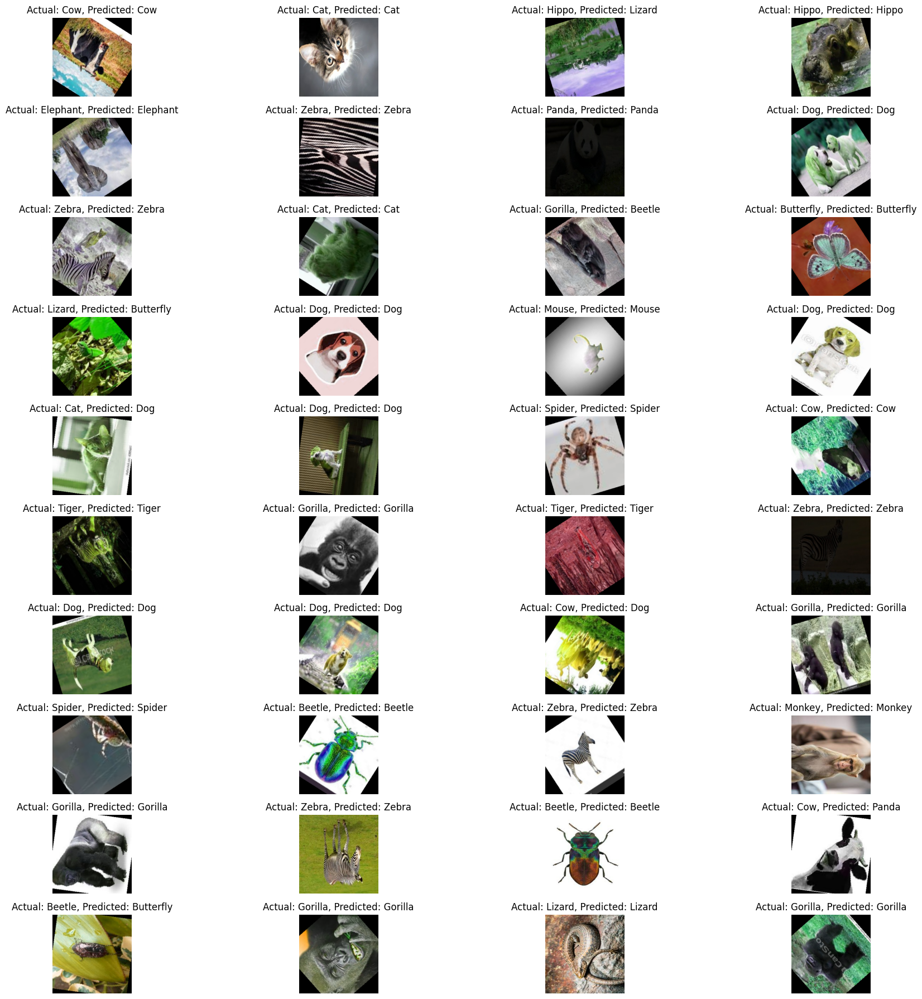

In [ ]:

# Số lượng hình ảnh cần hiển thị
num_images_to_display = 40
images = []
y_true = []

# Lấy 40 hình ảnh và nhãn từ test_ds
for img, lbl in test_ds.unbatch().take(num_images_to_display):
    images.append(img.numpy())  # Lưu hình ảnh đã chuẩn hóa
    y_true.append(np.argmax(lbl.numpy()))

# Chuyển đổi danh sách thành mảng numpy
images = np.array(images)
y_true = np.array(y_true)

# Chuyển đổi dữ liệu ảnh thành Tensor để dự đoán
images_tensor = tf.convert_to_tensor(images)

# Dự đoán trên các ảnh đã chuyển đổi
pred = model4.predict(images_tensor)
y_pred = np.argmax(pred, axis=1)

# Số lượng hình ảnh và nhãn thực tế trong test_ds
num_actual_images = len(images)

# Hiển thị hình ảnh và nhãn dự đoán
num_columns = 4
num_rows = (num_actual_images + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 18))
for i, ax in enumerate(axes.flat):
    if i < num_actual_images:
        # Khôi phục giá trị pixel về dải 0-255 để hiển thị
        image_to_display = (images[i] * 64).astype("uint8")
        ax.imshow(image_to_display)
        actual_label = dataset.class_names[y_true[i]]
        predicted_label = dataset.class_names[y_pred[i]]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

### 3.2. Test thử 1 tấm ảnh

Saving dao-khi-longphutourist-13.jpg to dao-khi-longphutourist-13.jpg


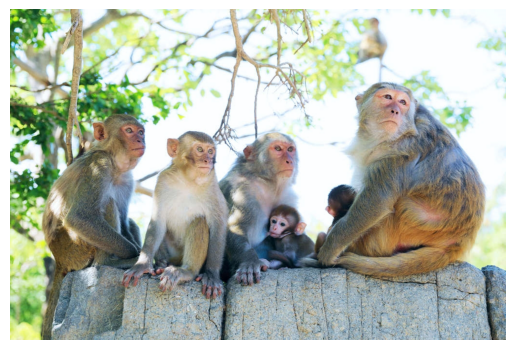

1/1 [==============================] - 0s 28ms/step
VGG16 Predicted class: Monkey
EfficientNetB7 Predicted class: Monkey
MobileNetV3 Predicted class: Monkey
Dense Predicted class: Monkey


In [ ]:
from google.colab import files
uploaded = files.upload()
# print(uploaded)

from PIL import Image
filename = next(iter(uploaded))

image = Image.open(filename)
plt.imshow(image)
plt.axis('off')  # Hide axes
plt.show()

# Load the image
image = tf.keras.preprocessing.image.load_img(filename, target_size=(224, 224, 3))

# image = tf.keras.preprocessing.image.load_img(filename)
# Preprocess the image
image = tf.keras.preprocessing.image.img_to_array(image)
image_64 = image/64.0

# Add a batch dimension
image = np.expand_dims(image, axis=0)
image_64 = np.expand_dims(image_64, axis=0)

# Predict the class
predictions1 = model1.predict(image)
predictions2 = model2.predict(image)
predictions3 = model3.predict(image)
predictions4 = model4.predict(image_64)

# Get the class with the highest probability
predicted_class1 = np.argmax(predictions1)
predicted_class2 = np.argmax(predictions2)
predicted_class3 = np.argmax(predictions3)
predicted_class4 = np.argmax(predictions4)

# Print the predicted class
print(f"VGG16 Predicted class: {classes[predicted_class1]}")
print(f"EfficientNetB7 Predicted class: {classes[predicted_class2]}")
print(f"MobileNetV3 Predicted class: {classes[predicted_class3]}")
print(f"Dense Predicted class: {classes[predicted_class4]}")


### 3.3. So sánh với các model khác

#### 3.3.1. So sánh Accuracy và Loss

In [ ]:
y_true = []
for images, labels in test_ds:
    y_true.extend(np.argmax(labels, axis=1))
def evaluate_model(model, test_ds):
    # y_true = []
    y_pred = []

    for images, labels in test_ds:
        predictions = model.predict(images)
        y_pred.extend(np.argmax(predictions, axis=1))
        # y_true.extend(np.argmax(labels, axis=1))

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)

    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    # print("Confusion Matrix:\n", conf_matrix)

    return accuracy, precision, recall, f1, conf_matrix

In [ ]:
# #CHẠY LỆNH NẾU CÁC MODEL ĐƯỢC TRAIN TRỰC TIẾP , KHÔNG CẦN LẤY TỪ CSDL
# # Các dữ liệu lịch sử từ các mô hình

# histories = [history1.history, history2.history, history3.history, history4.history]

# # Thu thập dữ liệu từ lịch sử huấn luyện
# train_loss = [history['loss'] for history in histories]
# val_loss = [history['val_loss'] for history in histories]
# train_acc = [history['accuracy'] for history in histories]
# val_acc = [history['val_accuracy'] for history in histories]

In [ ]:
import json

# Đọc lịch sử huấn luyện từ các tệp JSON
history_files = [
    '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history1.json',
    '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history2.json',
    '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history3.json',
    '/content/gdrive/MyDrive/Nhan_Dang_Con_Vat/convat_model/history4.json'
]

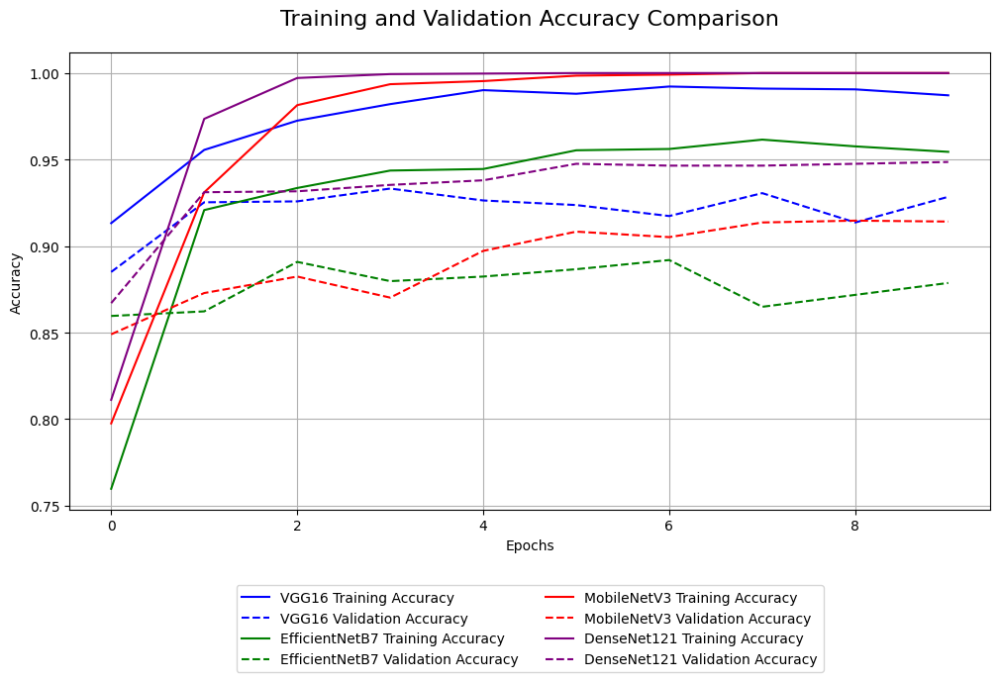

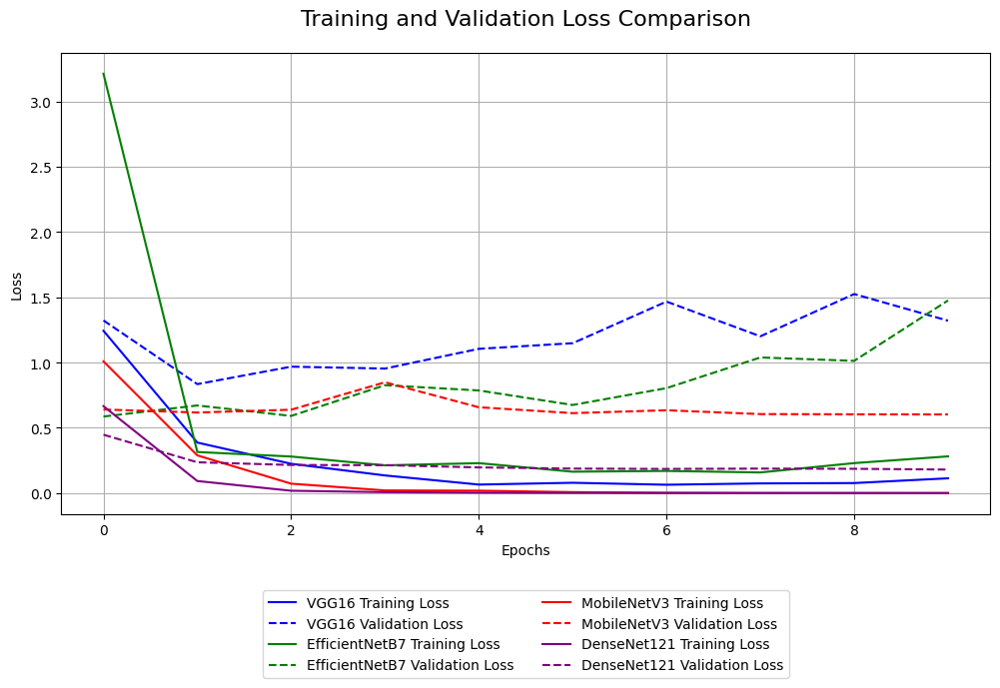

In [ ]:
import matplotlib.pyplot as plt

model_names = ['VGG16', 'EfficientNetB7', 'MobileNetV3', 'DenseNet121']

histories = []
for file_path in history_files:
    with open(file_path, 'r') as f:
        history = json.load(f)
        histories.append(history)

# Trích xuất thông tin từ lịch sử huấn luyện
train_loss = [history['loss'] for history in histories]
val_loss = [history['val_loss'] for history in histories]
train_acc = [history['accuracy'] for history in histories]
val_acc = [history['val_accuracy'] for history in histories]

# Màu sắc cho từng mô hình
colors = ['blue', 'green', 'red', 'purple']

# Vẽ đồ thị Accuracy
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.plot(train_acc[i], label=f'{model_names[i]} Training Accuracy', linestyle='-', color=colors[i])
    plt.plot(val_acc[i], label=f'{model_names[i]} Validation Accuracy', linestyle='--', color=colors[i])

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy Comparison', fontsize=16, pad=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.grid(True)
plt.show()

print('\n\n ')

# Vẽ đồ thị Loss
plt.figure(figsize=(12, 6))
for i in range(4):
    plt.plot(train_loss[i], label=f'{model_names[i]} Training Loss', linestyle='-', color=colors[i])
    plt.plot(val_loss[i], label=f'{model_names[i]} Validation Loss', linestyle='--', color=colors[i])

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Comparison', fontsize=16, pad=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.grid(True)
plt.show()



#### 3.3.2. So sánh Accuracy, Precision, Recall, F1-score

In [ ]:
# Các mô hình và tên để hiển thị
models = [model1, model2, model3, model4]
model_names = ['VGG16', 'EfficientNetB7', 'MobileNetV3', 'DenseNet121']
metrics = ['Precision', 'Recall', 'F1-score']
colors = ['green', 'orange', 'blue', 'red']

# Test các mô hình đã huấn luyện trên tập Test_ds
results = {}
for i in range(len(model_names)):
    model = models[i]
    name = model_names[i]
    if name == "DenseNet121":
        accuracy, precision, recall, f1, conf_matrix = evaluate_model(model, test_ds_64)
    else:
        accuracy, precision, recall, f1, conf_matrix = evaluate_model(model, test_ds)
    results[name] = {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "conf_matrix": conf_matrix}

1/1 [==============================] - 4s 4s/step
Accuracy: 0.9764102564102564
Precision: 0.9768048909310345
Recall: 0.9764102564102564
F1 Score: 0.9763367313125684
1/1 [==============================] - 9s 9s/step
Accuracy: 0.9517948717948718
Precision: 0.953928739760347
Recall: 0.9517948717948718
F1 Score: 0.9518086543484768
1/1 [==============================] - 2s 2s/step
Accuracy: 0.8153846153846154
Precision: 0.849082243387267
Recall: 0.8153846153846154
F1 Score: 0.8117276023925012
1/1 [==============================] - 5s 5s/step
Accuracy: 0.9846153846153847
Precision: 0.9846571456459515
Recall: 0.9846153846153847
F1 Score: 0.9845745328477664


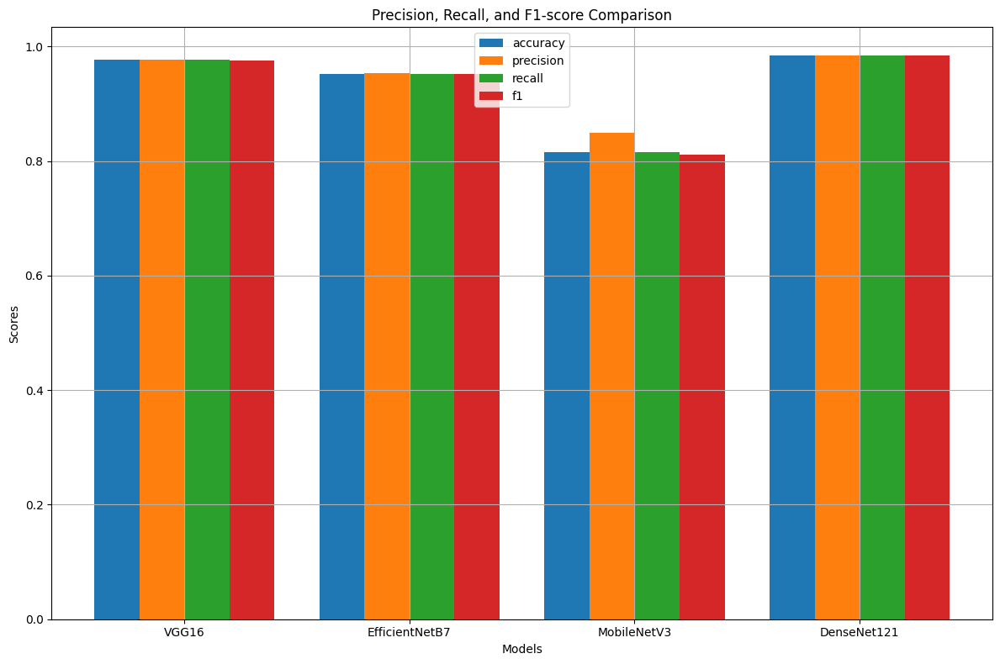

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

model_names = list(results.keys())
metrics = list(results[model_names[0]].keys())
metrics.remove('conf_matrix')
values = [[results[model_name][metric] for model_name in model_names] for metric in metrics]

x = np.arange(len(model_names))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 8))

for i, metric in enumerate(metrics):
    offset = width * i
    rects = ax.bar(x + offset, values[i], width, label=metric, align='center')

ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Precision, Recall, and F1-score Comparison')
ax.set_xticks(x + width * 1.5)  # Đặt ticks ở giữa giữa các nhóm cột
ax.set_xticklabels(model_names, ha='center')  # Đặt nhãn trục x ở giữa
ax.legend()

plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
from tabulate import tabulate

# Chuyển đổi dữ liệu vào danh sách các dòng
table = []
for model_name, metrics in results.items():
    table.append([model_name, metrics['accuracy'], metrics['precision'], metrics['recall'], metrics['f1']])

# In bảng sử dụng tabulate
headers = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1-score']
print(tabulate(table, headers=headers, floatfmt=".4f"))

Model             Accuracy    Precision    Recall    F1-score
--------------  ----------  -----------  --------  ----------
VGG16               0.9764       0.9768    0.9764      0.9763
EfficientNetB7      0.9518       0.9539    0.9518      0.9518
MobileNetV3         0.8154       0.8491    0.8154      0.8117
DenseNet121         0.9846       0.9847    0.9846      0.9846


#### 3.3.3. So sánh Confusion Matrix

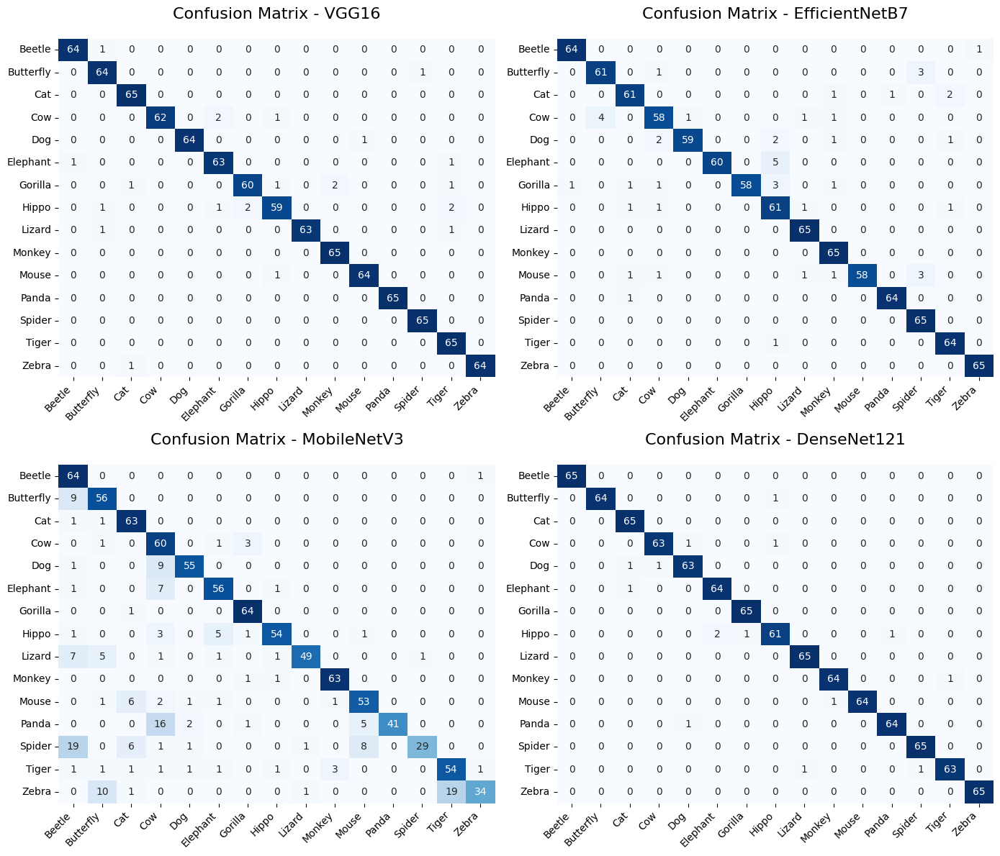

In [ ]:
# Đảm bảo rằng class_name có đúng 15 nhãn
class_name =['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Zebra']

# Extract confusion matrices from results
conf_matrices = [results[name]["conf_matrix"] for name in model_names]

# Plotting confusion matrices as heatmap using seaborn
fig, axs = plt.subplots(2, 2, figsize=(14, 12))

# Đặt khoảng cách giữa các subplot
plt.subplots_adjust(wspace=0.5, hspace=1)
for i, ax in enumerate(axs.flat):
    sns.heatmap(conf_matrices[i], annot=True, cmap='Blues', fmt='d', ax=ax, cbar=False)
    ax.set_title(f'Confusion Matrix - {model_names[i]}', fontsize=16,pad=20)
    ax.set_xticklabels(class_name, rotation=45, fontsize=10, ha='right')
    ax.set_yticklabels(class_name, fontsize=10, rotation=0)

  #  # Thêm nhãn "Accuracy" bên dưới của sơ đồ
  #   ax.text(0.5, -0.15, 'Accuracy', fontsize=12, ha='center', transform=ax.transAxes)
  # # Thêm nhãn "Predicted" bên trái của sơ đồ
  #   ax.text(-0.2, 0.5, 'Predicted', fontsize=12, va='center', rotation=90, transform=ax.transAxes)

plt.tight_layout()
plt.show()